In [8]:
pip install scikit-learn
pip install pandas
pip install numpy
pip install matplotlib
pip install seaborn
pip install scipy
pip install imbalanced-learn

SyntaxError: invalid syntax (792051111.py, line 1)

# Import libraries

In [ ]:
import pandas as pd

import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

import itertools

# Read data 

In [ ]:
df = pd.read_csv("water_potability.csv")

# Understand the data

In [ ]:
print("Data shape: " + str(df.shape) + "\n")     # Shape of data frame

Data shape: (3276, 10)



In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [ ]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.469956,32.879761,8768.570828,1.583085,36.142612,80.824064,3.308162,15.769881,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.277673,176.850538,15666.690297,6.127421,317.094638,365.734414,12.065801,56.647656,3.439711,0.000000
50%,7.080795,196.967627,20927.833607,7.130299,333.775777,421.884968,14.218338,66.396293,3.955028,0.000000
75%,7.870050,216.667456,27332.762127,8.114887,350.385756,481.792304,16.557652,76.666609,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


# Data Cleaning

In [ ]:
duplicate_rows = (df.duplicated().sum()) # Check for duplicates

print(f"Number of duplicate rows: {duplicate_rows}")

Number of duplicate rows: 0


**-> No duplicates to handle**

In [9]:
# Check for missing values
missing_values = df.isna().sum() 
print(f"Missing values: \n{missing_values}")

Missing values: 
ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64


In [6]:
# Handling missing values by replacing them with the mean of the column
for col in df.columns:
    df[col].fillna(df[col].mean(), inplace=True)

# Check for missing values after handling them
missing_values = df.isnull().sum()
print(f"Missing values after handling: \n{missing_values}")


Missing values after handling: 
ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64


C:\Users\quang\AppData\Local\Temp\ipykernel_22752\28330347.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mean(), inplace=True)


In [241]:
df

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.080795,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,333.775777,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,333.775777,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,333.775777,392.449580,19.903225,66.396293,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,333.775777,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,333.775777,402.883113,11.168946,77.488213,4.708658,1


## Plot multiple boxplots to visualize outliers


In [242]:
columns = df.columns
columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [243]:
cols = [col for col in columns]
cols

['ph',
 'Hardness',
 'Solids',
 'Chloramines',
 'Sulfate',
 'Conductivity',
 'Organic_carbon',
 'Trihalomethanes',
 'Turbidity',
 'Potability']

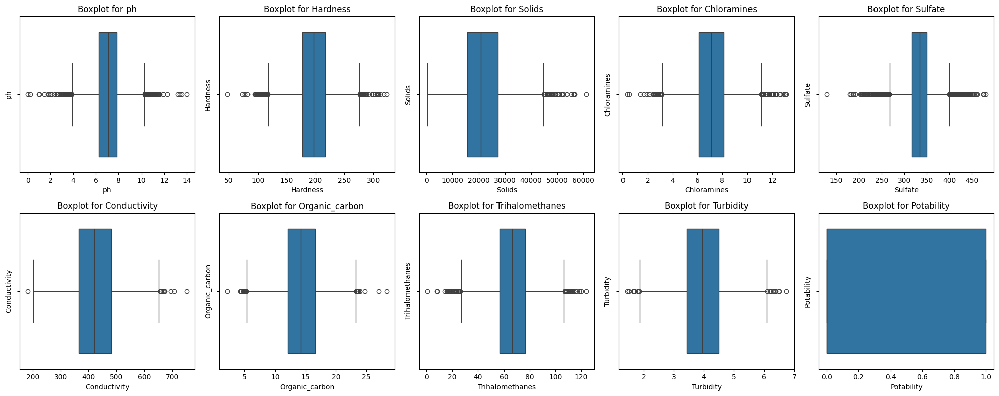

In [244]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))

for i, column in enumerate(columns):
    row = i // 5
    col = i % 5
    ax = axes[row, col]
    sns.boxplot(data=df, x=column, ax=ax)
    ax.set_title(f'Boxplot for {column}')
    ax.set_ylabel(column)

plt.tight_layout()
plt.show()

In [331]:
# # Standardizing data before removing outliers
# from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()
# df_scaled = scaler.fit_transform(df)
# df_scaled = pd.DataFrame(df_scaled, columns=columns)

# # df_scaled
# Standardizing data before removing outliers
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df)
df_scaled = pd.DataFrame(df_scaled, columns=columns)

df_scaled

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,0.505771,0.571139,0.336096,0.543891,0.680385,0.669439,0.313402,0.699753,0.286091,0.0
1,0.265434,0.297400,0.300611,0.491839,0.581699,0.719411,0.497319,0.450999,0.576793,0.0
2,0.578509,0.641311,0.321619,0.698543,0.581699,0.414652,0.562017,0.532866,0.303637,0.0
3,0.594055,0.605536,0.356244,0.603314,0.647347,0.317880,0.622089,0.808065,0.601015,0.0
4,0.649445,0.484851,0.289922,0.484900,0.514545,0.379337,0.358555,0.253606,0.496327,0.0
...,...,...,...,...,...,...,...,...,...,...
3271,0.333436,0.530482,0.775947,0.533436,0.656047,0.603192,0.448062,0.535037,0.564534,1.0
3272,0.557775,0.530016,0.279263,0.603473,0.581699,0.368912,0.678284,0.532673,0.254915,1.0
3273,0.672822,0.465486,0.539101,0.547807,0.581699,0.438152,0.338662,0.560655,0.349570,1.0
3274,0.366197,0.664407,0.191490,0.465860,0.581699,0.387157,0.343638,0.622659,0.616120,1.0


In [332]:
df_scaled

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,0.505771,0.571139,0.336096,0.543891,0.680385,0.669439,0.313402,0.699753,0.286091,0.0
1,0.265434,0.297400,0.300611,0.491839,0.581699,0.719411,0.497319,0.450999,0.576793,0.0
2,0.578509,0.641311,0.321619,0.698543,0.581699,0.414652,0.562017,0.532866,0.303637,0.0
3,0.594055,0.605536,0.356244,0.603314,0.647347,0.317880,0.622089,0.808065,0.601015,0.0
4,0.649445,0.484851,0.289922,0.484900,0.514545,0.379337,0.358555,0.253606,0.496327,0.0
...,...,...,...,...,...,...,...,...,...,...
3271,0.333436,0.530482,0.775947,0.533436,0.656047,0.603192,0.448062,0.535037,0.564534,1.0
3272,0.557775,0.530016,0.279263,0.603473,0.581699,0.368912,0.678284,0.532673,0.254915,1.0
3273,0.672822,0.465486,0.539101,0.547807,0.581699,0.438152,0.338662,0.560655,0.349570,1.0
3274,0.366197,0.664407,0.191490,0.465860,0.581699,0.387157,0.343638,0.622659,0.616120,1.0


<Axes: >

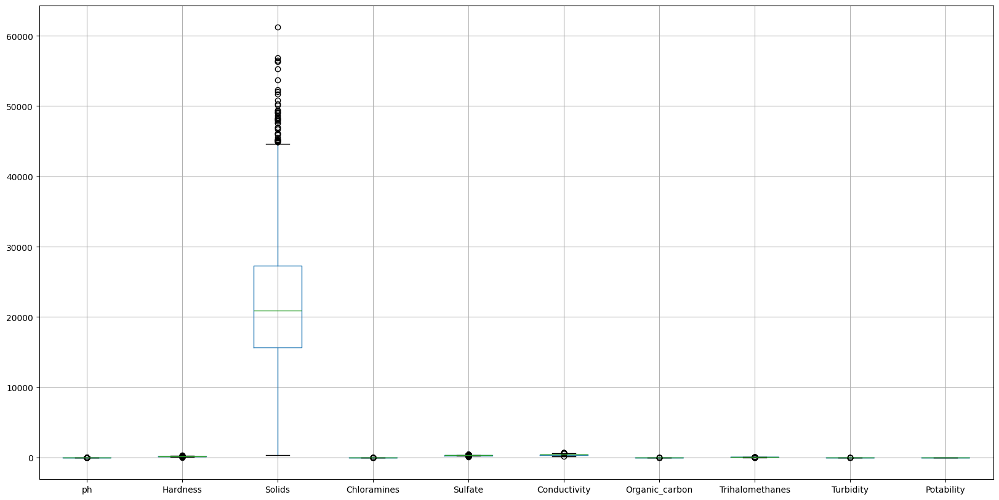

In [333]:
# # Before scaling
df.boxplot(column=cols, figsize=(20, 10))


<Axes: >

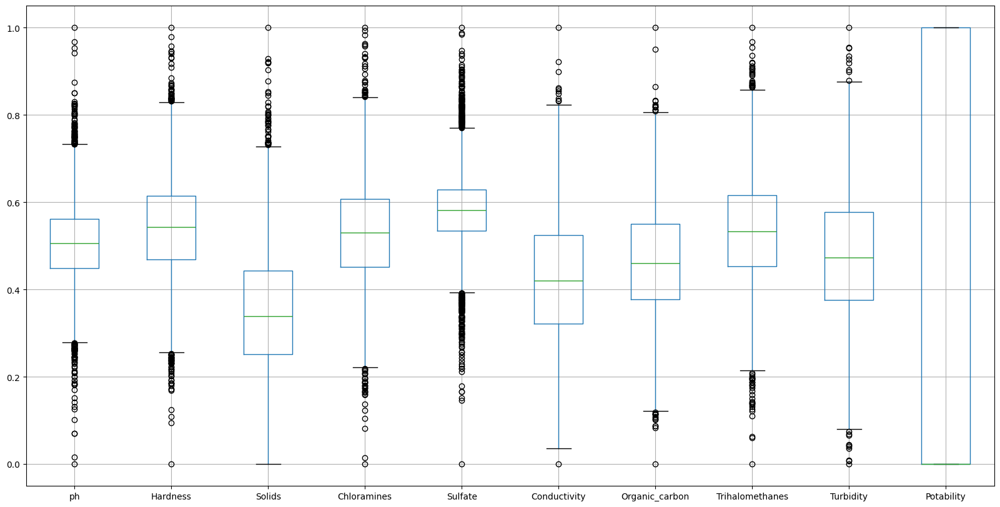

In [334]:

# # After scaling
df_scaled.boxplot(column=cols, figsize=(20, 10))

In [335]:
# Remove outliers using IQR
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Remove rows with outliers in this column
    df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df


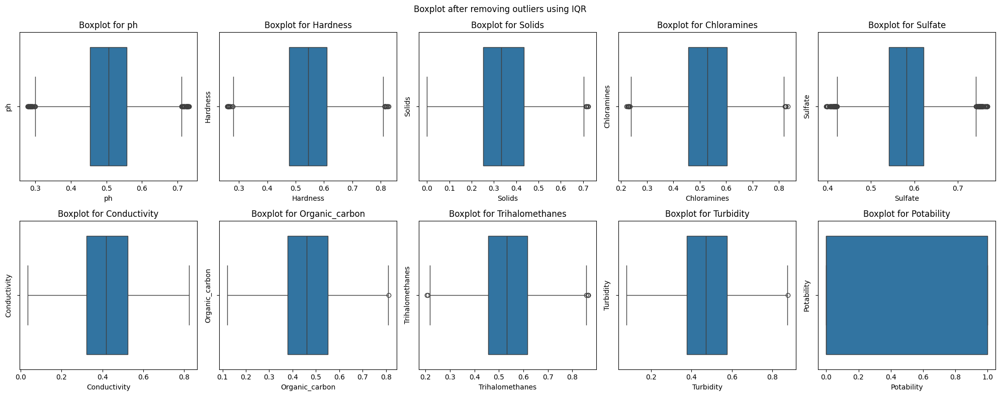

In [336]:

# Remove outliers using IQR for all columns
cleaned_df = df_scaled.copy()
for column in columns:
    cleaned_df = remove_outliers_iqr(cleaned_df, column)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))

for i, column in enumerate(columns):
    row = i // 5
    col = i % 5
    ax = axes[row, col]
    sns.boxplot(data=cleaned_df, x=column, ax=ax)
    ax.set_title(f'Boxplot for {column}')
    ax.set_ylabel(column)

plt.suptitle('Boxplot after removing outliers using IQR')
plt.tight_layout()
plt.show()


In [337]:
cleaned_df

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,0.505771,0.571139,0.336096,0.543891,0.680385,0.669439,0.313402,0.699753,0.286091,0.0
2,0.578509,0.641311,0.321619,0.698543,0.581699,0.414652,0.562017,0.532866,0.303637,0.0
3,0.594055,0.605536,0.356244,0.603314,0.647347,0.317880,0.622089,0.808065,0.601015,0.0
4,0.649445,0.484851,0.289922,0.484900,0.514545,0.379337,0.358555,0.253606,0.496327,0.0
5,0.398863,0.511010,0.466746,0.563043,0.561537,0.173092,0.237538,0.439550,0.209814,0.0
...,...,...,...,...,...,...,...,...,...,...
3270,0.433544,0.505009,0.423895,0.578908,0.615572,0.409897,0.378070,0.484188,0.419685,1.0
3272,0.557775,0.530016,0.279263,0.603473,0.581699,0.368912,0.678284,0.532673,0.254915,1.0
3273,0.672822,0.465486,0.539101,0.547807,0.581699,0.438152,0.338662,0.560655,0.349570,1.0
3274,0.366197,0.664407,0.191490,0.465860,0.581699,0.387157,0.343638,0.622659,0.616120,1.0


# 5. EDA


## 5.1 Variable Identification
Target Variable: Potability (0: Not Potable, 1: Potable)

Predictors (Input Variables): ph, Hardness, Solids, Chloramines, Sulfate, Conductivity, Organic_carbon, Trihalomethanes, Turbidity

## 5.2 Univariate Analysis

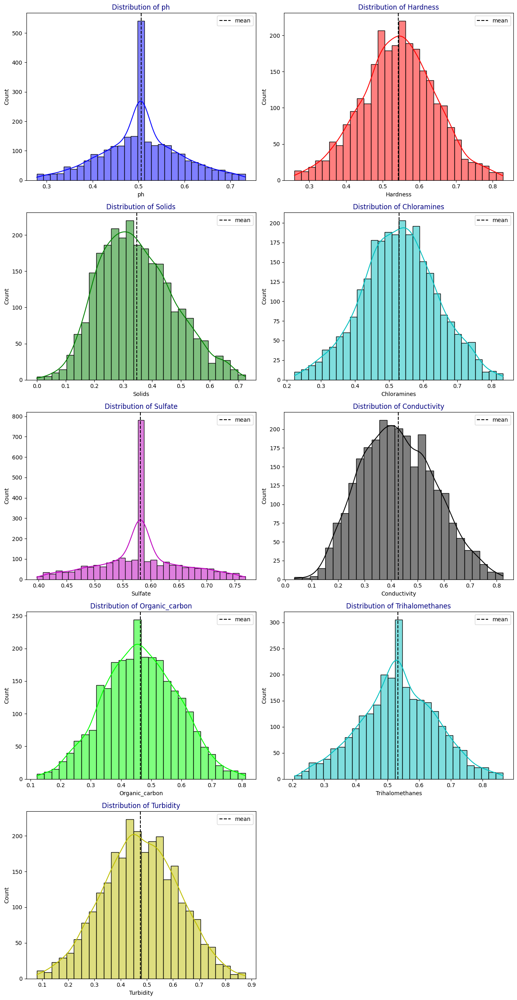

In [110]:
# Univariate Analysis for Numerical Columns
cols = cleaned_df.columns[:-1]  # Excluding target variable
length = len(cols)
colors = ["b", "r", "g", "c", "m", "k", "lime", "c", "y"]

fig = plt.figure(figsize=(13, 25))

for i, (col, color) in enumerate(zip(cols, colors)):
    plt.subplot(5, 2, i + 1)
    sns.histplot(cleaned_df[col], kde=True, color=color)
    plt.axvline(cleaned_df[col].mean(), linestyle="dashed", label="mean", color="k")
    plt.legend(loc="best")
    plt.title(f'Distribution of {col}', color="navy")

plt.tight_layout()
plt.show()


## 5.3 Study Summary Statistics

In [111]:
# Summary Statistics
summary = cleaned_df.describe()
summary

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability,ph*Hardness
count,2657.000000,2657.000000,2657.000000,2657.000000,2657.000000,2657.000000,2657.000000,2657.000000,2657.000000,2657.000000,2657.000000
mean,0.505564,0.542472,0.347166,0.529099,0.581915,0.427123,0.464616,0.533323,0.475006,0.373730,0.275443
std,0.086758,0.102530,0.129279,0.110442,0.074607,0.139733,0.123554,0.121502,0.143978,0.483884,0.075198
min,0.278748,0.259553,0.000000,0.222542,0.396690,0.035211,0.121164,0.206088,0.079897,0.000000,0.084234
25%,0.453817,0.477222,0.251078,0.457158,0.541819,0.322007,0.379128,0.456034,0.376153,0.000000,0.223452
50%,0.505771,0.544394,0.332534,0.529535,0.581699,0.419223,0.461432,0.532673,0.472138,0.000000,0.270206
75%,0.556702,0.610160,0.433605,0.602704,0.621907,0.524317,0.551133,0.616221,0.575637,1.000000,0.321760
max,0.732344,0.827909,0.723329,0.833503,0.768732,0.823724,0.811236,0.864568,0.876115,1.000000,0.561479


## 5.4 Multivariate Analysis

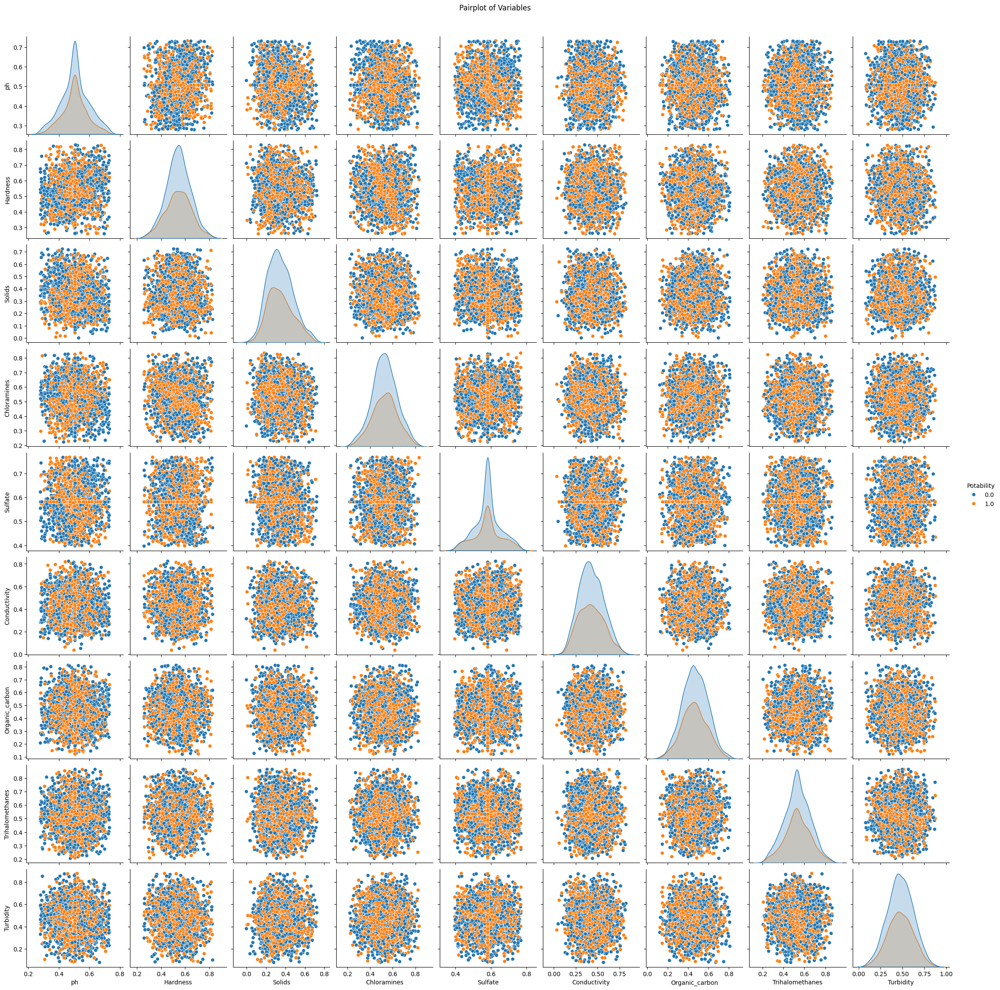

In [98]:
# Pairplot to explore relationships between variables
sns.pairplot(cleaned_df, hue='Potability', diag_kind='kde')
plt.suptitle('Pairplot of Variables', y=1.02)
plt.show()

## 5.5 Study Correlation



In [102]:
cleaned_df.corr()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
ph,1.000000,0.133697,-0.083710,-0.062465,0.014125,0.005026,0.024624,0.009009,-0.043474,-0.008261
Hardness,0.133697,1.000000,-0.045134,-0.040386,-0.026137,-0.026213,0.013528,-0.003313,-0.025089,-0.000347
Solids,-0.083710,-0.045134,1.000000,-0.040626,-0.112595,0.002585,0.024597,-0.023054,0.024193,0.007164
Chloramines,-0.062465,-0.040386,-0.040626,1.000000,0.023546,-0.015303,0.003802,0.018862,-0.007379,0.012948
Sulfate,0.014125,-0.026137,-0.112595,0.023546,1.000000,-0.002098,-0.008078,-0.017656,-0.021946,-0.011607
Conductivity,0.005026,-0.026213,0.002585,-0.015303,-0.002098,1.000000,0.008096,0.002231,0.010756,0.000513
Organic_carbon,0.024624,0.013528,0.024597,0.003802,-0.008078,0.008096,1.000000,-0.001124,-0.020313,-0.030161
Trihalomethanes,0.009009,-0.003313,-0.023054,0.018862,-0.017656,0.002231,-0.001124,1.000000,-0.024215,0.014416
Turbidity,-0.043474,-0.025089,0.024193,-0.007379,-0.021946,0.010756,-0.020313,-0.024215,1.000000,0.004178
Potability,-0.008261,-0.000347,0.007164,0.012948,-0.011607,0.000513,-0.030161,0.014416,0.004178,1.000000


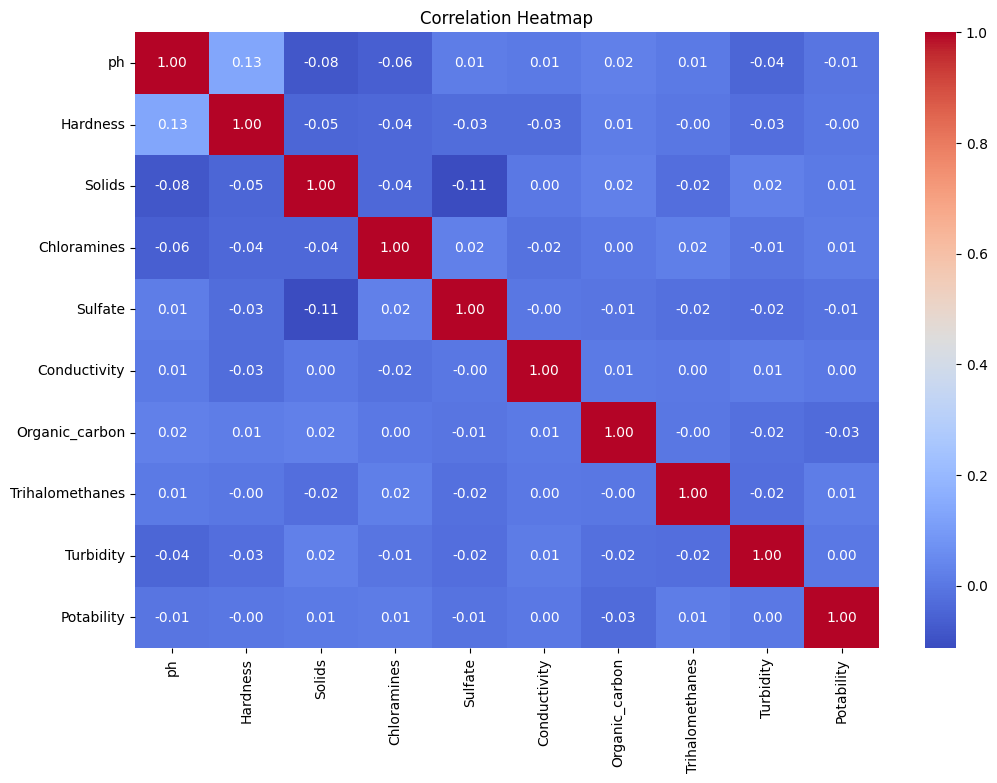

In [101]:
# Heatmap to visualize correlation
plt.figure(figsize=(12, 8))
sns.heatmap(cleaned_df.corr(), annot=True, cmap="coolwarm", fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

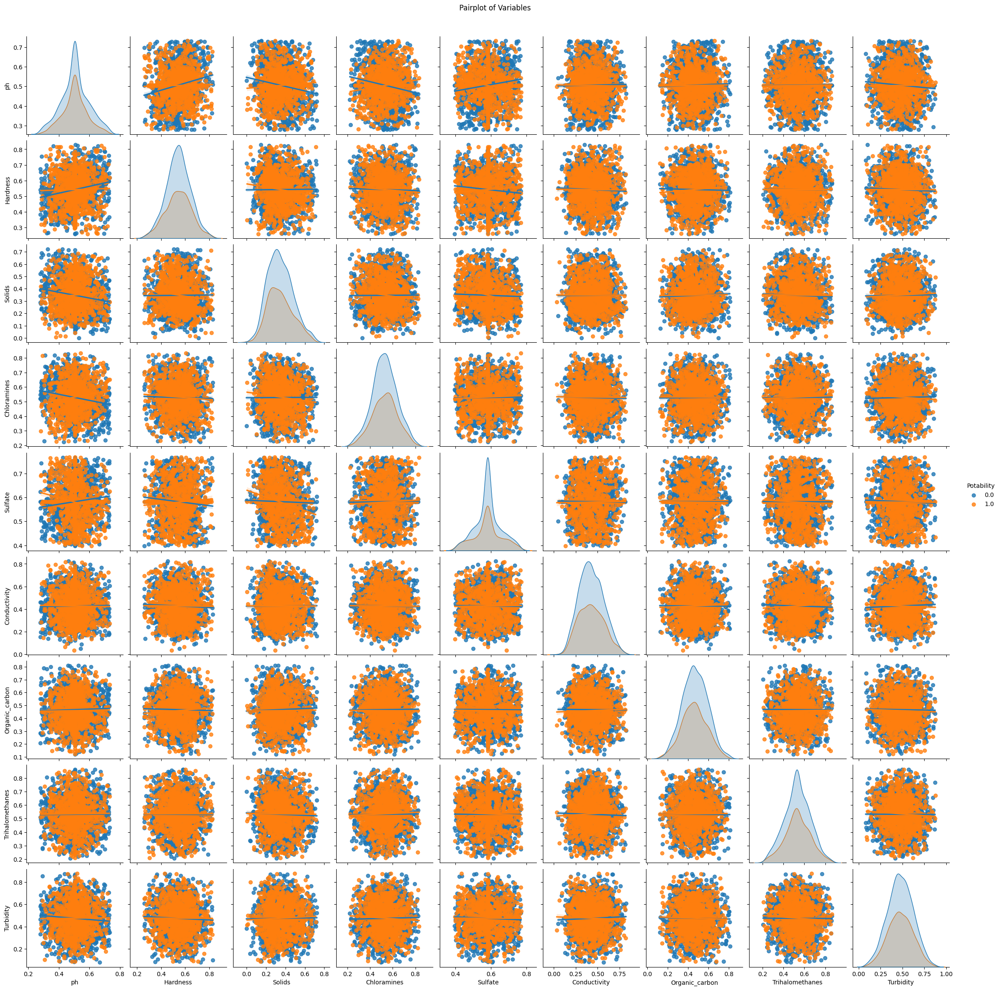

In [103]:
# Pairplot to explore relationships between variables
sns.pairplot(cleaned_df, hue='Potability', kind='reg')
plt.suptitle('Pairplot of Variables', y=1.02)
plt.show()

## 5.6 EDA (Exploratory Data Analysis) Summary

# 3. Feature Engineering and Feature Selection

In [338]:
# Selecting relevant features based on correlation and EDA insights
X = cleaned_df[['ph', 'Hardness', 'Solids', 'Chloramines', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']]
y = cleaned_df['Potability']

# Creating interaction terms if needed (example)
cleaned_df['ph*Hardness'] = cleaned_df['ph'] * cleaned_df['Hardness']


In [339]:
y.value_counts()

Potability
0.0    1664
1.0     993
Name: count, dtype: int64

Imbalanced dataset!

In [321]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [322]:
# # Apply SMOTE to handle class imbalance
from imblearn.over_sampling import SMOTE     # Load the SMOTE library
smote = SMOTE(random_state=42)
X_train_oversampling, y_train_oversampling = smote.fit_resample(X_train, y_train)

In [323]:
cleaned_df

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability,ph*Hardness
0,0.505771,0.571139,0.336096,0.543891,0.680385,0.669439,0.313402,0.699753,0.286091,0.0,0.288866
2,0.578509,0.641311,0.321619,0.698543,0.581699,0.414652,0.562017,0.532866,0.303637,0.0,0.371004
3,0.594055,0.605536,0.356244,0.603314,0.647347,0.317880,0.622089,0.808065,0.601015,0.0,0.359721
4,0.649445,0.484851,0.289922,0.484900,0.514545,0.379337,0.358555,0.253606,0.496327,0.0,0.314884
5,0.398863,0.511010,0.466746,0.563043,0.561537,0.173092,0.237538,0.439550,0.209814,0.0,0.203823
...,...,...,...,...,...,...,...,...,...,...,...
3270,0.433544,0.505009,0.423895,0.578908,0.615572,0.409897,0.378070,0.484188,0.419685,1.0,0.218944
3272,0.557775,0.530016,0.279263,0.603473,0.581699,0.368912,0.678284,0.532673,0.254915,1.0,0.295630
3273,0.672822,0.465486,0.539101,0.547807,0.581699,0.438152,0.338662,0.560655,0.349570,1.0,0.313189
3274,0.366197,0.664407,0.191490,0.465860,0.581699,0.387157,0.343638,0.622659,0.616120,1.0,0.243304


In [324]:
# Before oversampling
print("Before oversampling: " + str(X_train.shape))
print(np.unique(y_train, return_counts=True))                  # Print number of labels, label '1' dominates '0'

# After oversampling
print("After oversampling: " + str(X_train_oversampling.shape))
print(np.unique(y_train_oversampling, return_counts=True))     # Print number of labels, now label '0' and '1' have the same number of labels.

Before oversampling: (1859, 10)
(array([0., 1.]), array([1159,  700], dtype=int64))
After oversampling: (2318, 10)
(array([0., 1.]), array([1159, 1159], dtype=int64))


In [325]:
# Train the Decision Tree Classifier
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train_oversampling, y_train_oversampling)

# Evaluate the model
train_score = model.score(X_train_oversampling, y_train_oversampling)
test_score = model.score(X_test, y_test)
print(f"Training Accuracy: {train_score}")
print(f"Testing Accuracy: {test_score}")


Training Accuracy: 1.0
Testing Accuracy: 0.5714285714285714


# Draft 2

In [343]:
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

# Tách đặc trưng và nhãn
X = cleaned_df.drop('Potability', axis=1)
y = cleaned_df['Potability']

# Xử lý giá trị thiếu
# imputer = SimpleImputer(strategy='mean')
# X = imputer.fit_transform(X)

# Chia dữ liệu thành tập huấn luyện và kiểm tra
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
# # Apply SMOTE to handle class imbalance
from imblearn.over_sampling import SMOTE     # Load the SMOTE library
smote = SMOTE(random_state=42)
X_train_oversampling, y_train_oversampling = smote.fit_resample(X_train, y_train)

from sklearn.model_selection import GridSearchCV
# import accuracy_score
from sklearn.metrics import accuracy_score
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=5)
# grid_search.fit(X_train_oversampling, y_train_oversampling)
grid_search.fit(X_train, y_train)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

print(f'Best Parameters: {grid_search.best_params_}')
print(f'Accuracy: {accuracy_score(y_test, y_pred):.2f}')

Best Parameters: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2}
Accuracy: 0.62


# Draft

In [ ]:

# -- Handle missing data
missing_data = df.isna().sum()

print(missing_data)


In [ ]:

# Summar statistics
df.describe().to_csv("summary_statistics.csv")

# Univariate analysis
# cols = [i for i in df.columns if i not in ['Potability']]

# for column in cols:
#      # Plot the histogram with KDE
#     plt.figure(figsize=(8, 4))
#     sns.histplot(data=df, x=column, kde=True, bins=20)
#     plt.title(f'Distribution of {column}')
#     plt.show()


# Multi-variate analysis
# sns.pairplot(df, diag_kind = 'kde', corner = True);
# plt.show()

# Correlation matrix via heatmap
# Check the Correlation
corr = abs(df.corr())

lower_triangle = np.tril(corr, k=-1) # Exclude the diagonal
mask = lower_triangle == 0 # Mask the upper triangle

plt.figure(figsize=(12,10))
sns.heatmap(lower_triangle, center=0.5, cmap='coolwarm', annot=True, xticklabels = corr.index, yticklabels = corr.columns,
        cbar= True, linewidths= 1, mask = mask)   # Da Heatmap
plt.show()